In [1]:
    from scipy.io import arff
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt

In [2]:
def getDataSet():
    curr_path = os.getcwd()
    print(curr_path)
    data_path = os.path.join(curr_path, "dataset")
    PATH = os.path.join(data_path, "mit-bih-arrhythmia-database-1.0.0")

    # PATH="./MIT-BIH/"     #path, 这里就是写刚才你保存的数据地址  
    HEADERFILE="105.hea"     #文件格式为文本格式 
    ATRFILE="105.atr"     #attributes-file 文件以二进制格式 
    DATAFILE="105.dat"     #data-file  
    SAMPLES2READ=210000     #读取的数据样本点数
    ####################读取头文件######################
    f=open(os.path.join(PATH, HEADERFILE),"r")
    z=f.readline().split()
    nosig,sfreq=int(z[1]),int(z[2])     #% number of signals，sample rate of data

    dformat,gain,bitres,zerovalue,firstvalue=[],[],[],[],[]
    for i in range(nosig):
        z=f.readline().split()
        dformat.append(int(z[1]))     #format; here only 212 is allowed
        gain.append(int(z[2]))     #number of integers per mV
        bitres.append(int(z[3]))     #bitresolution
        zerovalue.append(int(z[4]))     #integer value of ECG zero point
        firstvalue.append(int(z[5]))     #first integer value of signal (to test for errors)
    f.close()
    ####################读取dat文件######################
    f=open(os.path.join(PATH, DATAFILE),"rb")     #以二进制格式读入dat文件
    b=f.read()   
    f.close()

    A_init=np.frombuffer(b,dtype=np.uint8)      #将读入的二进制文件转化为unit8格式
    A_shape0=int(A_init.shape[0]/3)     
    A=A_init.reshape(A_shape0,3)[:SAMPLES2READ]     #将A转为3列矩阵

    M=np.zeros((SAMPLES2READ,2))     #创建矩阵M

    M2H=A[:,1]>>4     #字节向右移四位，即取字节的高四位
    M1H=A[:,1]&15     #取字节的低四位

    PRL=(A[:,1]&8)*(2**9)     #sign-bit   取出字节低四位中最高位，向左移九位，等于乘2^9
    PRR=A[:,1]&128<<5     #sign-bit   取出字节高四位中最高位，向左移五位

    M1H=M1H*(2**8)
    M2H=M2H*(2**8)

    M[:,0]=A[:,0]+M1H-PRL
    M[:,1]=A[:,2]+M2H-PRR

    if ((M[1,:]!=firstvalue).any()):
        print("inconsistency in the first bit values")

    if nosig==2:
        M[:, 0] = (M[:, 0] - zerovalue[0]) / gain[0]
        M[:, 1] = (M[:, 1] - zerovalue[1]) / gain[1]
        TIME=np.linspace(0,SAMPLES2READ-1,SAMPLES2READ)/sfreq
    elif nosig==1:
        M2=[]
        M[:, 0] = M[:, 0] - zerovalue[0]
        M[:, 1] = M[:, 1] - zerovalue[1]
        for i in range(M.shape[0]):
            M2.append(M[:,0][i])
            M2.append(M[:,1][i])
        M2.append(0)
        del M2[0]
        M2=np.array(M2)/gain[0]
        TIME=np.linspace(0,2*SAMPLES2READ-1,2*SAMPLES2READ)/sfreq
    else:
        print("Sorting algorithm for more than 2 signals not programmed yet!")
    ####################读取atr文件######################
    f=open(os.path.join(PATH, ATRFILE),"rb")     #主要是读取ATR文件中各周期数据并在之后打印在图中
    b=f.read()
    f.close()

    A_init=np.frombuffer(b,dtype=np.uint8)
    A_shape0=int(A_init.shape[0]/2)
    A=A_init.reshape(A_shape0,2)

    ANNOT,ATRTIME=[],[]
    i=0
    while i < A.shape[0]:
        annoth=A[i,1]>>2
        if annoth==59:
            ANNOT.append(A[i+3,1]>>2)
            ATRTIME.append(A[i+2,0]+A[i+2,1]*(2**8)+A[i+1,0]*(2**16)+A[i+1,1]*(2**24))
            i+=3
        elif annoth==60:pass
        elif annoth==61:pass
        elif annoth==62:pass
        elif annoth==63:
            hilfe=(A[i,1]&3)*(2**8)+A[i,0]
            hilfe=hilfe+hilfe%2
            i+=int(hilfe/2)
        else:
            ATRTIME.append((A[i,1]&3)*(2**8)+A[i,0])
            ANNOT.append(A[i,1]>>2)
        i+=1

    del ANNOT[len(ANNOT)-1]
    del ATRTIME[len(ATRTIME)-1]

    ATRTIME=np.array(ATRTIME)
    ATRTIME=np.cumsum(ATRTIME)/sfreq

    ind=np.where(ATRTIME<=TIME[-1])[0]
    ATRTIMED=ATRTIME[ind]

    ANNOT=np.round(ANNOT)
    ANNOTD=ANNOT[ind]
    # #####################显示ECG####################
    # plt.plot(TIME,M[:,0],linewidth="0.5",c="r")
    # if nosig==2:
    #     plt.plot(TIME, M[:, 1], linewidth="0.5", c="b")
    # for i in range(len(ATRTIMED)):
    #     plt.text(ATRTIMED[i],0,str(ANNOTD[i]))
    # plt.xlim(TIME[0],TIME[-1])
    # plt.xlabel("Time / s")
    # plt.ylabel("Votage / mV")
    # plt.title("ECG signal ")
    # plt.show()
    
    dataSet = []
    for i in range(0, 2):
        data = []
        for j in range(0, 100):
            data.append(M[:, 0][2100*j:2100*(j+1)])
        dataSet.append(data)

    listBounds = []
    for data in dataSet:
        _max = max(map(max, data))
        _min = min(map(min, data))
        upperBound = _max + (_max - _min) * 0.1
        lowerBound = _min - (_max - _min) * 0.1
        listBounds.append((lowerBound, upperBound))
    #plot original data
    #print(dataDict)
    return dataSet, listBounds

In [3]:
dataSet, listBounds = getDataSet()

g:\聚义岩\Block+MachineLearning\Algorithm\SLADE


In [4]:
# set parameters
from _slade_mts import SladeMts
segmentLength = 100
paaSize = 10 # every single time
alphabetSize = 10
pStep = 10
seriesLen = 2100
sladeMts = SladeMts(dataSet = dataSet, listBounds = listBounds, segmentLength = segmentLength, alphabetSize = alphabetSize, paaSize = paaSize, pStep = pStep, seriesLen = seriesLen)
listPatterns = sladeMts.patternGenerate()
listNewTimeSeries, patternLocations = sladeMts.dataTransformation(dataSet, listPatterns)

正在生成patterns...
0.0
0.5
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


C:\Users\HuangXuanning\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_least_angle.py:615: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.832e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.107e-08. Reduce max_iter or increase eps parameters.
  warnings.warn('Regressors in active set degenerate. '
C:\Users\HuangXuanning\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_least_angle.py:615: ConvergenceWarning: Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.832e-03, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.980e-08. Reduce max_iter or increase eps parameters.
  warnings.warn('Regressors in active set degenerate. '
C:\Users\HuangXuanning\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_least_angle.py:615: Conver

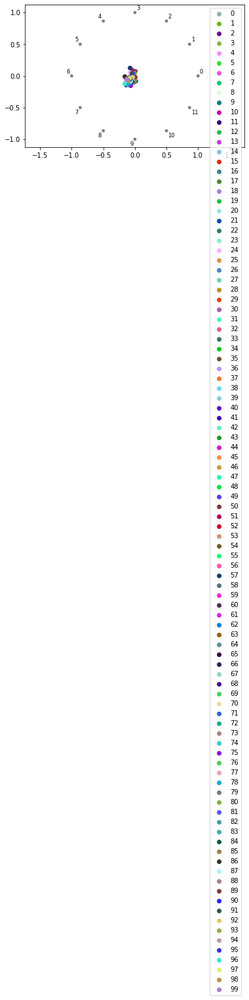

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

featureNum = 12
selectedFeature, idx = SladeMts.featureSelection(listNewTimeSeries, featureNum)

# -------------- plot ----------------#
shape = selectedFeature.shape
print(shape)
columnNames = []
for i in range(0, shape[1]):
    columnNames.append(str(i))
df = pd.DataFrame(selectedFeature, columns = columnNames)
df[str(shape[1])] = '1'
for i in range(0, shape[0]):
    df[str(shape[1])][i] = str(i)
print(df)
pd.plotting.radviz(df, str(shape[1]))
plt.show()

In [6]:
from sklearn.cluster import DBSCAN
import numpy as np
res = []
# 迭代不同的eps值
for min_samples in range(2,10):
    # 迭代不同的min_samples值
    for eps in np.arange(1,15,1):
        dbscan = DBSCAN(eps = eps, min_samples = min_samples)
        # 模型拟合
        dbscan.fit(selectedFeature)
        # 统计各参数组合下的聚类个数（-1表示异常点）
        n_clusters = len([i for i in set(dbscan.labels_) if i != -1])
        # 异常点的个数
        outliners = np.sum(np.where(dbscan.labels_ == -1, 1,0))
        # 统计每个簇的样本个数
        stats = str(pd.Series([i for i in dbscan.labels_ if i != -1]).value_counts().values)
        res.append({'eps':eps,'min_samples':min_samples,'n_clusters':n_clusters,'outliners':outliners,'stats':stats})
# 将迭代后的结果存储到数据框中
pd.set_option('display.max_rows', None)        
df = pd.DataFrame(res)
print(df)

<ipython-input-6-158fa0600c58>:16: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = str(pd.Series([i for i in dbscan.labels_ if i != -1]).value_counts().values)
<ipython-input-6-158fa0600c58>:16: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = str(pd.Series([i for i in dbscan.labels_ if i != -1]).value_counts().values)
<ipython-input-6-158fa0600c58>:16: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  stats = str(pd.Series([i for i in dbscan.labels_ if i != -1]).value_counts().values)
<ipython-input-6-158fa0600c58>:16: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a fut

In [7]:
from _slade_mts import SladeMts
eps = 10
min_samples = 4
sensibility = 3
anomalyIndex,anomalyLocations = SladeMts.anomalyDetection_DBScan(selected_features = selectedFeature, features_idx = idx, patternLocations = patternLocations, eps = eps, min_samples = min_samples, sensibility = sensibility)
print(anomalyIndex)
print(anomalyLocations)

[33]
[[(0, 600, 2100)]]


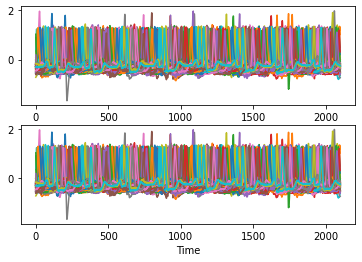

In [10]:
fig = plt.figure()
cnt = 1
for data in dataSet:
    ax = fig.add_subplot(2, 1, cnt)
    ax.set_xlabel('Time')
    for i in range(0, len(data)):
        ax.plot(data[i])
    cnt += 1
plt.show()

In [8]:
anomalyDict = {}

for i in range(0, len(anomalyIndex)):
    for location in anomalyLocations[i]:
        dim = location[0]
        if anomalyDict.get(location[0]) == None:
            anomalyDict[dim] = []
        anomalyDict[dim].append((anomalyIndex[i], location[1], location[2]))
print(anomalyDict) 

{0: [(33, 600, 2100)]}


!!!


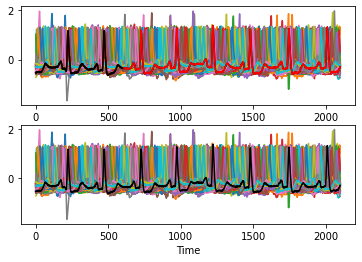

In [9]:
fig = plt.figure()
cnt = 1
mainSeries = 33
for data in dataSet:
    ax = fig.add_subplot(2, 1, cnt)
    ax.set_xlabel('Time')
    for series in data:
        ax.plot(series)
    ax.plot(data[mainSeries], color = 'black')

    if anomalyDict.get((cnt-1)) != None:
        locations = anomalyDict[cnt-1]
        for location in locations:
            if location[0] == mainSeries:
                print('!!!')
                ax.plot(data[mainSeries][0:location[2]], color = 'red')
                ax.plot(data[mainSeries][0:location[1]], color = 'black')
            
    cnt += 1
plt.show()

In [ ]:
fig = plt.figure()
cnt = 1
mainSeries = 57
for data in dataSet:
    ax = fig.add_subplot(2, 1, cnt)
    ax.set_xlabel('Time')
    for series in data:
        ax.plot(series)
    ax.plot(data[mainSeries], color = 'black')

    if anomalyDict.get((cnt-1)) != None:
        locations = anomalyDict[cnt-1]
        for location in locations:
            if location[0] == mainSeries:
                print('!!!')
                ax.plot(data[mainSeries][location[1]:location[2]], color = 'red')
            
    cnt += 1
plt.show()